In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [36]:
import h5py as h5
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import sobel
import os
import yaml
import random

In [26]:
configs = yaml.safe_load(open('./configs/train.yaml'))
configs

{'data_path': '~/sciebo (2)/EBRAINS/',
 'data_fom': 'fom',
 'data_trans': 'transmittance',
 'trans_suffix': 'NTransmittance',
 'fom_suffix': 'FOM_HSV',
 'train_vervet': 'Vervet1818',
 'val_vervet': 'Vervet1947',
 'levels': ['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10'],
 'lr': 0.001,
 'weight_decay': 0.0001,
 'device': 'cuda',
 'batch_size': 64,
 'num_workers': 12,
 'train_epoch_size': 65536,
 'num_epochs': 50,
 'log_interval': 100,
 'val_epoch_size': 512}

In [27]:
data_path = configs['data_path']
data_fom = os.path.join(data_path, configs['data_fom'])
data_trans = os.path.join(data_path, configs['data_trans'])
# expanduser expands the path to the user home directory
data_path = os.path.expanduser(data_path)
data_fom = os.path.expanduser(data_fom)
data_trans = os.path.expanduser(data_trans)

In [28]:
# pick 5 sections for training and 2 for evaluation
files = os.listdir(data_fom)
train = [file for file in files if configs['train_vervet'] in file]
val = [file for file in files if configs['val_vervet'] in file]
random.seed(25)
train = random.sample(train, 5)
random.seed(25)
val = random.sample(val, 2)

# export the list to a yaml file
with open('./configs/train_files.yaml', 'w') as file:
    yaml.dump({'train': train, 'val': val}, file)

In [29]:
def load_data(file):
    f = h5.File(file, 'r')
    return f['pyramid']

# test the function
data = load_data(os.path.join(data_fom, train[0]))
print(data['00'].shape)

(24867, 21601, 3)


In [100]:
def select_region(pyramid, level, cx, cy, w, h):
    ''' Select a region from the pyramid image
    Args:
        pyramid: h5py dataset
        level: pyramid level
        cx: center x coordinate
        cy: center y coordinate
        w: width of the region
        h: height of the region
    Returns:
        region: numpy array of the selected region
    '''

    img = pyramid[level]
    x, y = cx - w // 2, cy - h // 2

    # make sure the region is within the image
    if x < 0:
        x = 0
    if y < 0:
        y = 0
    if x + w > img.shape[1]:
        w = img.shape[1] - x
    if y + h > img.shape[0]:
        h = img.shape[0] - y

    return img[y:y+h, x:x+w]

(b) Visualize an appropriate pyramid level for each of the downloaded sections (FOM
and transmittance) to get an impression of the full content

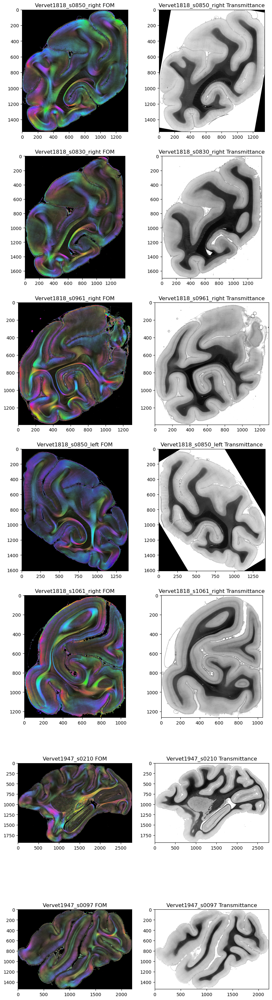

In [31]:
levels = configs['levels']
trans = configs['trans_suffix']
fom = configs['fom_suffix']

# plot all the sections with 1k~ x 1k~ resolution
fig, axes = plt.subplots(7, 2, figsize=(10, 40))

for i in range(5):
    # plot FOM
    file = os.path.join(data_fom, train[i])
    pyramid = load_data(file)
    for level in reversed(levels):
        img = pyramid[level]
        if img.shape[0] > 1000 and img.shape[1] > 1000:
            break
    axes[i][0].imshow(img)
    title = train[i].replace("_" + fom + ".h5", " FOM")
    axes[i][0].set_title(title)

    # plot transmittance
    file = os.path.join(data_trans, train[i])
    file = file.replace(fom, trans)
    pyramid = load_data(file)
    axes[i][1].imshow(pyramid[level], cmap='gray')
    title = train[i].replace("_" + fom + ".h5", " Transmittance")
    axes[i][1].set_title(title)

for i in range(2):
    # plot FOM
    file = os.path.join(data_fom, val[i])
    pyramid = load_data(file)
    for level in reversed(levels):
        img = pyramid[level]
        if img.shape[0] > 1000 and img.shape[1] > 1000:
            break
    axes[i+5][0].imshow(img)
    title = val[i].replace("_" + fom + ".h5", " FOM")
    axes[i+5][0].set_title(title)

    # plot transmittance
    file = os.path.join(data_trans, val[i])
    file = file.replace(fom, trans)
    pyramid = load_data(file)
    axes[i+5][1].imshow(pyramid[level], cmap='gray')
    title = val[i].replace("_" + fom + ".h5", " Transmittance")
    axes[i+5][1].set_title(title)

plt.show()

(c) Locate some interesting structures and visualize full-resolution crops in the FOM and transmittance maps. Do not load the full section into memory for this.

The level of the image for scanning is 8


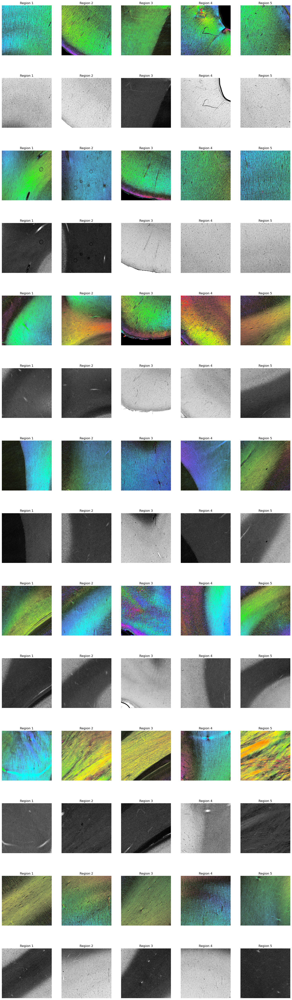

In [ ]:
# try to find colorful regions in the image (saturation)
# for each image we pick 5 prominent regions

pyramid = load_data(os.path.join(data_fom, train[0]))
# pick the 8th level of the pyramid for scanning, which is ~256x smaller
# than the original image
scan_level = 8
print("The level of the image for scanning is", scan_level)

def select_regions(pyramid, levels, scan_level, n=5):
    ''' Select n regions with the highest median sobel value
    Args:
        pyramid: h5py dataset
        levels: list of pyramid levels
        n: number of regions to select
    Returns:
        regions: list of tuples, each tuple is (median sobel value, x, y)
    '''

    img = pyramid[levels[scan_level]]

    # scan the image by the 5 x 5 window and find the region with the
    # 5 highest median sobel value
    regions = []
    for i in range(img.shape[0] // 5):
        for j in range(img.shape[1] // 5):
            region = img[i*5:(i+1)*5, j*5:(j+1)*5, 1]
            regions.append((np.median(region), i*5, j*5))


    regions.sort(reverse=True)
    return regions[:n]


# plot the regions of FOM and transmittance
def plot_regions(pyramid, levels, scan_level, regions, axes, i):
    ''' Plot the full resolution image of the selected regions
    Args:
        pyramid: h5py dataset
        levels: list of pyramid levels
        scan_level: level for scanning
        regions: list of tuples, each tuple is (median sobel value, x, y)
        axes: matplotlib axes
        i: index of the row of the axes
    '''
    for j, region in enumerate(regions):
        _, y, x = region
        res = 2**scan_level * 5
        cx = x * 2**scan_level + res//2
        cy = y * 2**scan_level + res//2
        region = select_region(pyramid, levels[0], cx, cy, res, res)
        axes[i][j].imshow(region, cmap='gray')
        axes[i][j].set_title(f"Region {j+1}")
        axes[i][j].axis('off')

fig, axes = plt.subplots(14, 5, figsize=(20, 70))

for i in range(5):
    pyramid = load_data(os.path.join(data_fom, train[i]))
    regions = select_regions(pyramid, levels, scan_level)
    plot_regions(pyramid, levels, scan_level, regions, axes, i*2)
    file = os.path.join(data_trans, train[i])
    file = file.replace(fom, trans)
    pyramid = load_data(file)
    plot_regions(pyramid, levels, scan_level, regions, axes, i*2+1)

for i in range(2):
    pyramid = load_data(os.path.join(data_fom, val[i]))
    regions = select_regions(pyramid, levels, scan_level)
    plot_regions(pyramid, levels, scan_level, regions, axes, i*2+10)
    file = os.path.join(data_trans, val[i])
    file = file.replace(fom, trans)
    pyramid = load_data(file)
    plot_regions(pyramid, levels, scan_level, regions, axes, i*2+11)